In [1]:
import os
import numpy as np
import pandas as pd
import arcgis
import json
import pickle

from arcgis.gis import GIS
from arcgis.geometry import Point, MultiPoint
from arcgis.features import GeoAccessor, GeoSeriesAccessor
from pathlib import Path

from greenheart.tools.keys import set_arcgis_key_dot_env
from hopp.tools.resource.resource_tools import get_country

CD = str(os.path.abspath(''))

# Set API key using .env file
set_arcgis_key_dot_env()
ARCGIS_API_KEY = os.getenv("ARCGIS_API_KEY")

# Compile LCOHs
def compile_lcoh(folder):

    lats = []
    lons = []
    lcohs = []
    
    fns = os.listdir(folder)
    
    for fn in fns:
    
        # Get lat and lon from filename
        uscore1idx = fn.index('_')
        lat = np.float64(fn[:uscore1idx])
        uscore2idx = fn[(uscore1idx+1):].index('_') + uscore1idx+1
        lon = np.float64(fn[(uscore1idx+1):uscore2idx])

        # Read lcoh and append to array
        if uscore2idx > 0:
            reader = open(folder+'/'+fn,"rb")
            lcoh = pickle.load(reader)
            lats.append(lat)
            lons.append(lon)
            lcohs.append(lcoh)

    return lats, lons, lcohs

# Import 2D array of LCOH
input_path = CD+'/../data_library'
output_path = CD+'/output/example_plant_pre_profast/lcoh'
lats, lons, lcohs = compile_lcoh(output_path)
geodata_fp = input_path +'/geography/countries.geojson'
with open(geodata_fp, 'r') as open_file:
    geodata = json.load(open_file)
lats = np.array(lats,ndmin=2)
lons = np.array(lons,ndmin=2)
lcoh_array = np.array(lcohs,ndmin=2)

# Make lists of lats, lons, and data
lat_list = []
lon_list = []
lcoh_list = []
max_lcoh = 10.
shape_list = []
x, y = np.shape(lats)
for i in range(x):
    print(i)
    for j in range(y):
        # Filter out non-usa points
        country = get_country(lats[i,j], lons[i,j], geodata)
        if (country == 'United States of America') or ((country == 'unknown') and ((i != 88) or (j < 11) or (j > 14))):
            lat_list.append(lats[i,j])
            lon_list.append(lons[i,j])
            lcoh_list.append(np.min([lcoh_array[i,j],max_lcoh]))
            if j == 0:
                shape_list.append('s')
            else:
                shape_list.append('o')

# Rearrange to 1-D spatial dataframe
coord_df = pd.DataFrame({'lat':lat_list, 'lon':lon_list})
coord_df['lcoh'] = lcoh_list
coord_sdf = pd.DataFrame.spatial.from_xy(coord_df,'lon','lat')

0


In [2]:
# Figure out mercator width and height
lat_min = 25
lat_max = 50
lon_min = -125
lon_max = -67

# Stolen from gis.stackexchange.com/questions/156035
def merc_x(lon):
  r_major=6378137.000
  return r_major*(lon*np.pi/180)
def merc_y(lat):
  if lat>89.5:lat=89.5
  if lat<-89.5:lat=-89.5
  r_major=6378137.000
  r_minor=6356752.3142
  temp=r_minor/r_major
  eccent=(1-temp**2)**.5
  phi=(lat*np.pi/180)
  sinphi=np.sin(phi)
  con=eccent*sinphi
  com=eccent/2
  con=((1.0-con)/(1.0+con))**com
  ts=np.tan((np.pi/2-phi)/2)/con
  y=0-r_major*np.log(ts)
  return y

min_x = merc_x(lon_min)
max_x = merc_x(lon_max)
min_y = merc_y(lat_min)
max_y = merc_y(lat_max)

width = (max_x-min_x)/1000
height = (max_y-min_y)/1000

In [7]:
# Import display modules and widen notebook
from IPython.display import display, HTML
from ipywidgets import *
display(HTML("<style>.container { width:100% !important; }</style>"))

# Create map and set up display
gis = GIS()
gis = GIS(url='https://jmtjk39zmmjephwj.maps.arcgis.com/',
          username='jmartin4nrel',
          password='WhDiEvBe40?!')
map = gis.map("USA", zoomlevel=5)
map.center = [38.5,-97]
colormap = 'jet'
dpi = 92
map.layout=Layout(flex='1 1', width='{:d}px'.format(int(width/4)), height='{:d}px'.format(int(height/4)))
map.extent = {'spatialReference':{'wkid':3857},
                                    'xmin':min_x,
                                    'ymin':min_y,
                                    'xmax':max_x,
                                    'ymax':max_y}

# Set up point renderer with color mapping
rend = arcgis.mapping.renderer.generate_classbreaks(coord_sdf,
                                                    'Point',
                                                    colors=colormap,
                                                    field='lcoh',
                                                    class_count=255, 
                                                    marker_size=5,
                                                    line_width=1,
                                                    outline_color=[0,0,0,255])
max_vals = [np.min(coord_sdf['lcoh'].values)]
max_vals.extend([i['classMaxValue'] for i in rend['classBreakInfos']])
colors = [i['symbol']['color'] for i in rend['classBreakInfos']]

# Plot the colored points
coord_sdf.spatial.plot(map,renderer=rend)
map
# map.save({'title':'LCOH',
#         'snippet':'Map created using Python API showing levelized cost of methanol',
#         'tags':[],
#         'extent':{'spatialReference':{'wkid':3857},
#                         'xmin':min_x,
#                         'ymin':min_y,
#                         'xmax':max_x,
#                         'ymax':max_y}})

HTML(value='<style>.container { width:100% !important; }</style>')

MapView(layout=Layout(flex='1 1', height='888px', width='1614px'))

In [8]:
fn = 'web_map.png'
map_path = CD+'/output/example_plant_pre_profast'
map_url = map.webmap.print('PNG32',dpi=dpi*4,
                           extent={'spatialReference':{'wkid':3857},
                                'xmin':min_x,
                                'ymin':min_y,
                                'xmax':max_x,
                                'ymax':max_y},
                            output_dimensions=(width,height))
import requests
with requests.get(map_url) as resp:
    with open(map_path+'/'+fn, 'wb') as file_handle:
        file_handle.write(resp.content)

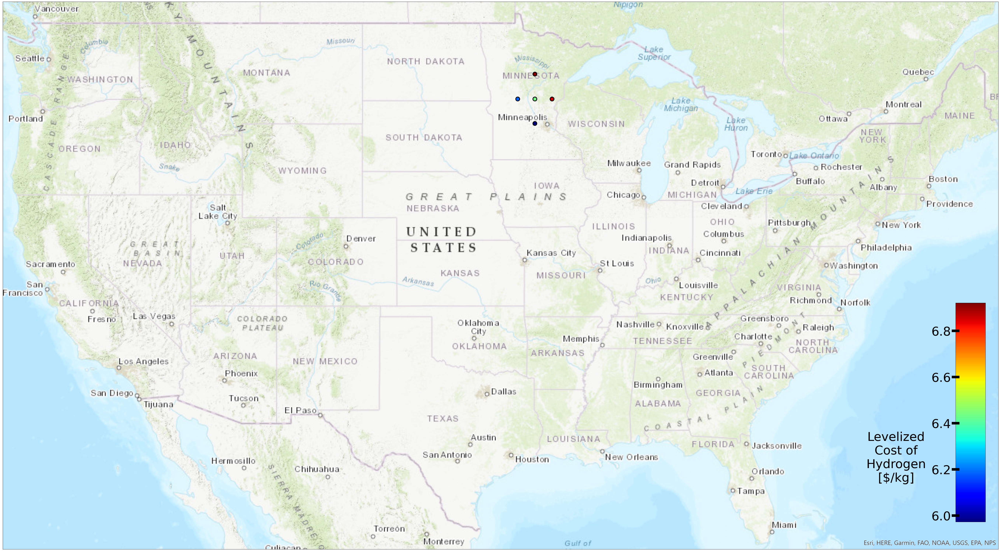

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig = plt.gcf()
fig.set_figwidth(width/dpi)
fig.set_figheight(height/dpi)

im = plt.imshow(np.reshape(max_vals,(16,16)), cmap='jet')
image = plt.imread(map_path+'/'+fn)
plt.imshow(image, extent=[0, width, 0, height])
plt.xticks([])
plt.yticks([])
plt.rcParams['font.size'] = 48
plt.rcParams['xtick.major.size'] = 10

ax = plt.gca()
bbox = ax.bbox.bounds
cbaxes = inset_axes(ax, width="3%", height="80%", loc=7, bbox_to_anchor=(bbox[0],bbox[1],bbox[2]*.99,bbox[3]*.5)) 
cbar = plt.colorbar(im, cax=cbaxes, ticklocation='left')
cbaxes.tick_params(direction='inout', length=30, width=10)
plt.text(-2.0,6.25,'Levelized\nCost of\nHydrogen\n[$/kg]',horizontalalignment='center',verticalalignment='center')


plt.show()